# Predicting Check-ins of Foursquare Users in Tokyo

## 2 - Exploratory Data Analysis

In [1]:
# Import libraries
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams

%matplotlib inline

In [2]:
# Setup default matplotlib defaults for later use
def defaultsettings():
    rcParams.update(matplotlib.rcParamsDefault)
    sns.set_style()
    sns.set_context()
    %matplotlib inline

In [3]:
# Setup Seaborn settings for bar plots
def postersettings():
    rcParams.update(matplotlib.rcParamsDefault)
    sns.set_style("whitegrid")
    sns.set_context("poster")

In [4]:
# Define settings for plotting spatial coodinates of venues where users checked-in.
def mapsettings(x_size, y_size, dpi):
    plt.style.use('default')  # Styling
    new_style = {'grid': False}  # Remove grid
    matplotlib.rc('axes', **new_style)
    rcParams['figure.figsize'] = (x_size, y_size)  # Size of figure
    rcParams['figure.dpi'] = dpi
    rcParams['font.size'] = 16

In [5]:
def sort_unique(old_list):
    return(sorted(set(old_list)))

In [6]:
def indices_to_names(df, col_indices, col_names):
    sorted_unique_indices = sort_unique(df[col_indices].values)
    cat_names = [df.loc[df[col_indices] == index, col_names].values[0]
                 for index in sorted_unique_indices]
    return(sorted_unique_indices, cat_names)

In [7]:
def plot_piechart(series, title):
    postersettings()
    counts_series = series.value_counts()
    plt.pie(counts_series, labels=counts_series.index, autopct='%1.1f%%')
    plt.title(title)
    plt.show()

In [8]:
def plot_checkins_byweek(df, col_indices, col_names, title):

    postersettings()

    palette = plt.rcParams['axes.prop_cycle'].by_key()['color']

    cat_indices, cat_names = indices_to_names(df, col_indices, col_names)

    plt.figure()
    plt.gca().set_prop_cycle(color=[palette[index] for index in cat_indices])

    for index in cat_indices:

        df_by_hour = pd.DataFrame(
            df[df[col_indices] == index].resample('H').count().userid)

        if df_by_hour.shape[0]:

            df_by_hour['hour'] = df_by_hour.index.hour
            df_by_hour['weekday'] = df_by_hour.index.weekday
            df_by_hour.groupby(['weekday', 'hour']
                               ).sum().userid.plot(linewidth=1.5)

    plt.xlabel('')
    plt.ylabel('Total Check-ins')
    plt.title(title)

    plt.legend(cat_names, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.xticks(np.arange(0, 7*24, 24), ('Monday', 'Tuesday',
                                        'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'))
    plt.show()

In [9]:
def plot_gps_settings(ax):
    ax.set_facecolor('black')
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

In [10]:
def plot_checkins_bygps(df, col_indices, s=0.02, alpha=0.6, composite=False):

    mapsettings(12.5, 11, 250)
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    indices = sort_unique(df[col_indices].values)

    if composite:
        fig, ax = plt.subplots()

    for index in indices:

        if not composite:
            fig, ax = plt.subplots()

        df[df[col_indices] == index].plot(
            kind='scatter', x='long', y='lat', color=colors[index], s=s, alpha=alpha, ax=ax)

        if not composite:
            plot_gps_settings(ax)

    if composite:
        plot_gps_settings(ax)

In [11]:
# Load wrangled data.
df = pd.read_csv('df_afterwrangling.csv',
                 index_col=0,
                 parse_dates=[0],
                 date_parser=pd.to_datetime,
                 infer_datetime_format=True)

In [12]:
df.head()

,userid,venuecat,lat,long,day,hour,maincat,venuecat_encoded,maincat_encoded
timestamp,,,,,,,,,
2012-04-04 03:17:18,1541,Cosmetics Shop,35.705101,139.619590,2,3,Shop & Service,129,1
2012-04-04 03:22:04,868,Ramen / Noodle House,35.715581,139.800317,2,3,Food,2,2
2012-04-04 04:12:07,114,Convenience Store,35.714542,139.480065,2,4,Shop & Service,3,1
2012-04-04 04:12:13,868,Food & Drink Shop,35.725592,139.776633,2,4,Shop & Service,6,1
2012-04-04 04:18:23,1458,Housing Development,35.656083,139.734046,2,4,Residence,213,8


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 573703 entries, 2012-04-04 03:17:18 to 2013-02-16 11:35:29
Data columns (total 9 columns):
userid              573703 non-null int64
venuecat            573703 non-null object
lat                 573703 non-null float64
long                573703 non-null float64
day                 573703 non-null int64
hour                573703 non-null int64
maincat             573703 non-null object
venuecat_encoded    573703 non-null int64
maincat_encoded     573703 non-null int64
dtypes: float64(2), int64(5), object(2)
memory usage: 43.8+ MB


In [14]:
xmin, xmax, ymin, ymax = df.long.values.min(
), df.long.values.max(), df.lat.values.min(), df.lat.values.max()

### Display proportion of check-ins for each of 9 main venue categories

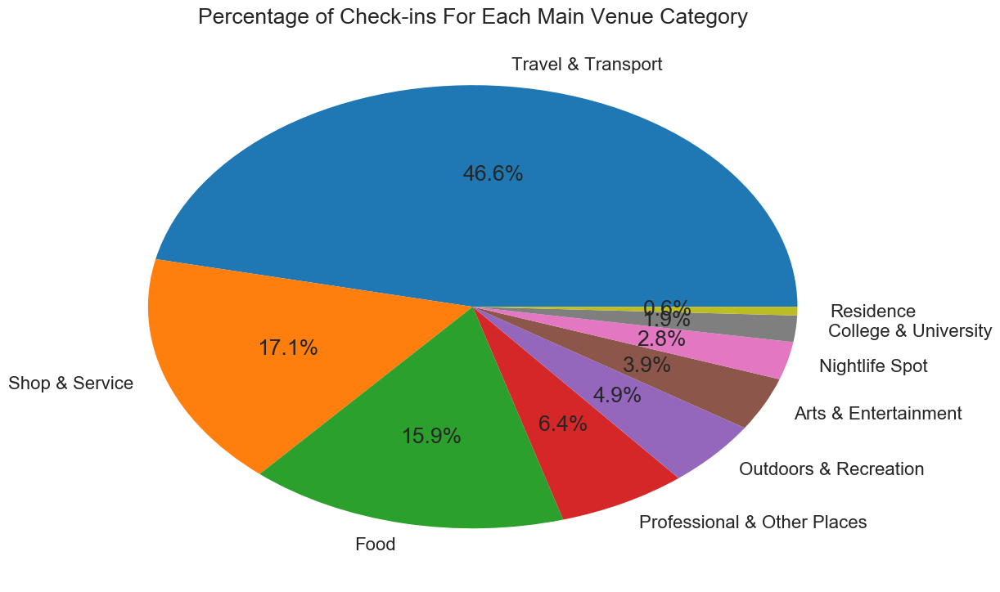

In [15]:
# Draw a pie chart showing the relative counts for each main category.
plot_piechart(
    df.maincat, title='Percentage of Check-ins For Each Main Venue Category')

### Deeper dive: display proportion of check-ins for each of 247 venue categories

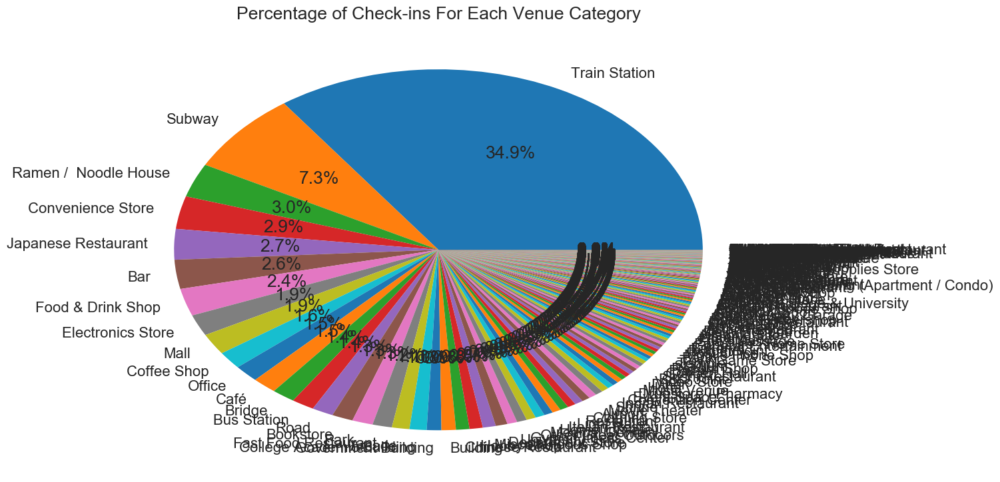

In [16]:
# Draw a pie chart showing the relative counts for each main category.
plot_piechart(
    df.venuecat, title='Percentage of Check-ins For Each Venue Category')

The distribution of check-ins shows almost half of all check-ins belonging to Travel & Transport. This is not surprising, as trains and subways are the preferred modes of transportation around Tokyo. After Travel & Transport, the next two most popular venue categories are Shop & Service and Food. The rest of the venue categories occupy slimmer slices of the overall pie.

The abundance of Travel & Transport check-ins introduces imbalance in this data set, which will make task of multiclass classification challenging. As a result, careful feature selection and feature engineering will be crucial in giving our classifiers the best chance to discriminate among the many venue categories.

Let's see what kind of information we can gather through continued visualization of each venue category.

### Show weekly check-ins for main venue categories

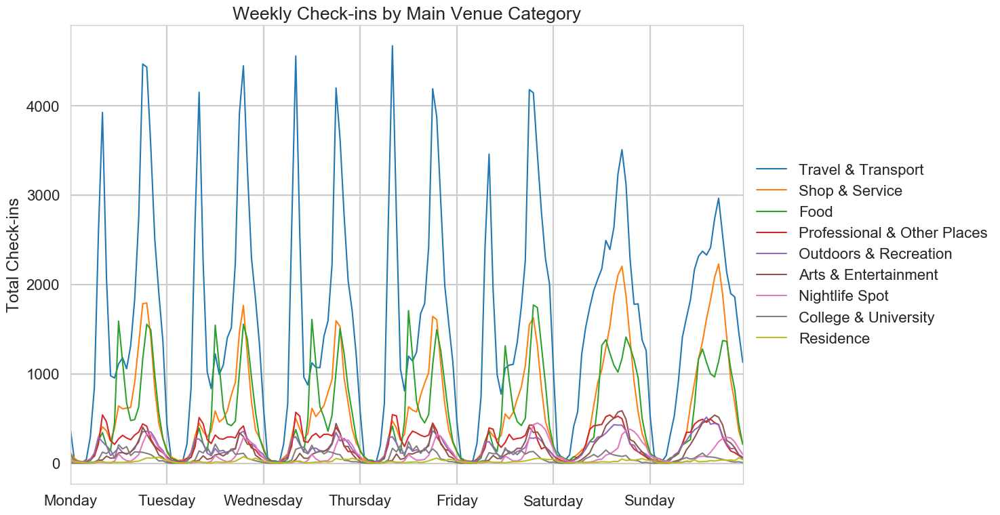

In [17]:
plot_checkins_byweek(df, col_indices='maincat_encoded',
                     col_names='maincat', title='Weekly Check-ins by Main Venue Category')

Travel & Transport
 - Strong peaks during morning and evening commutes with a small bump during lunchtime.
     - Heavy out of necessity
 - Weekdays show a different signature compared to weekends.
 - Check-ins during weekdays drop off a bit on Friday.
 
Shop & Service
 - Shopping peaks during morning commute, lunchtime, and dinnertime. Clearly strongest at dinnertime.
 - More by ~33% from weekdays to weekends

Food
 - A lot of people skip breakfast (or eat at home) and just eat lunch and dinner
 
Professional & Other Places
 - Peaks with morning commute, lunchtime, and evening commute. Are these workers?
 
Outdoors & Recreation
 - Peaks with breakfast, lunch, and dinner during weekdays
 - One large peak for Saturday and Sunday
 
Arts & Entertainment
 - Peaks during dinnertime weekdays, single peak for both weekend days
 
Nightlife Spot
 - Peaks during noon, highest during dinner on weekdays
 - Friday has most check-ins followed by Saturday
 - One peak for Saturday and Sunday

College & University
 - Peaks every ~2 hours. Users check-in in between classes?
 - Peaks ~7am, drops ~7pm

Residence
 - Mostly during evenings.

### Show weekly check-ins for Train Station, Subway, and all others

In [18]:
df["y0"] = 2
df.loc[df.venuecat_encoded == 0, "y0"] = 0
df.loc[df.venuecat_encoded == 1, "y0"] = 1

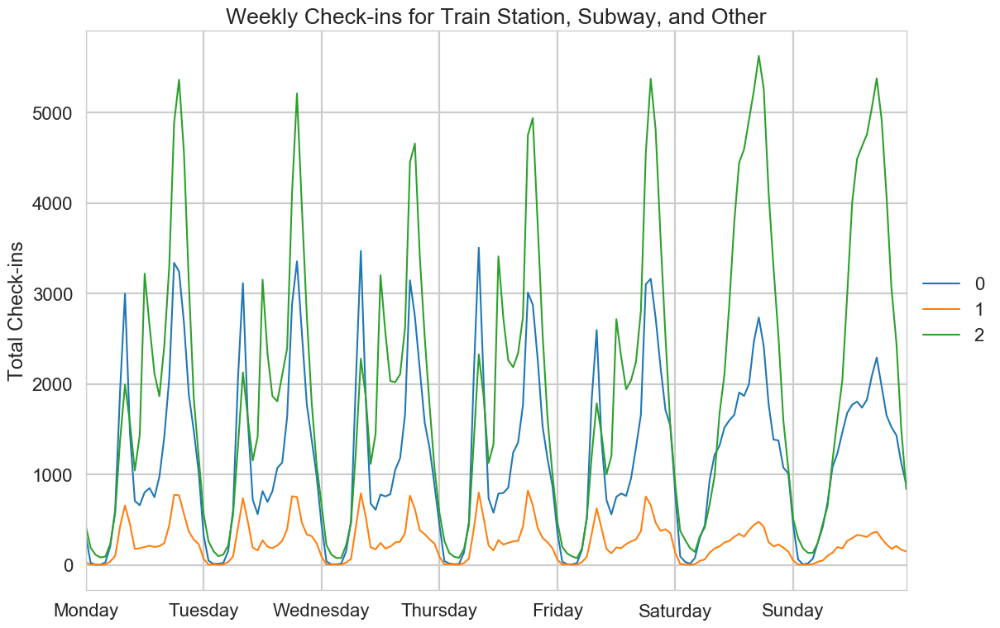

In [19]:
plot_checkins_byweek(df, col_indices='y0', col_names='y0',
                     title='Weekly Check-ins for Train Station, Subway, and Other')

### User-specific weekly check-ins for main venue categories


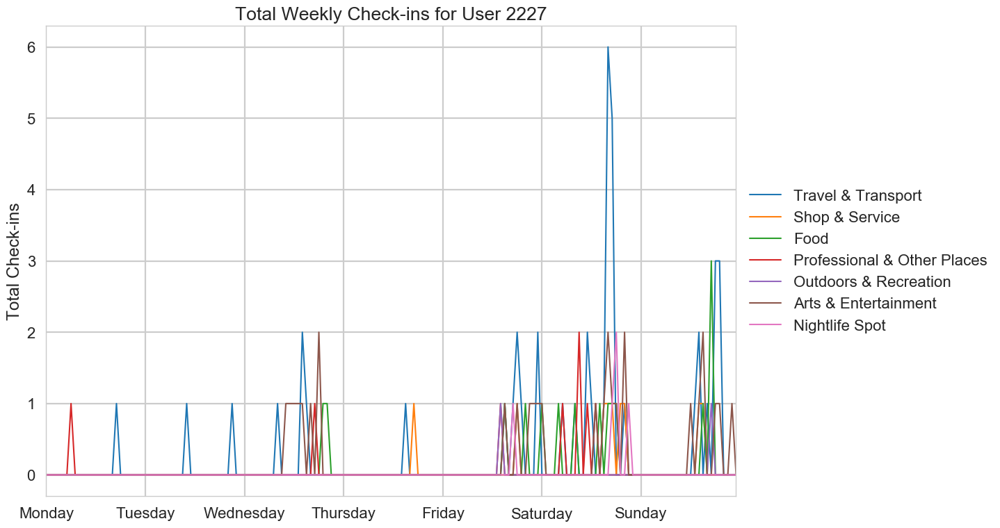

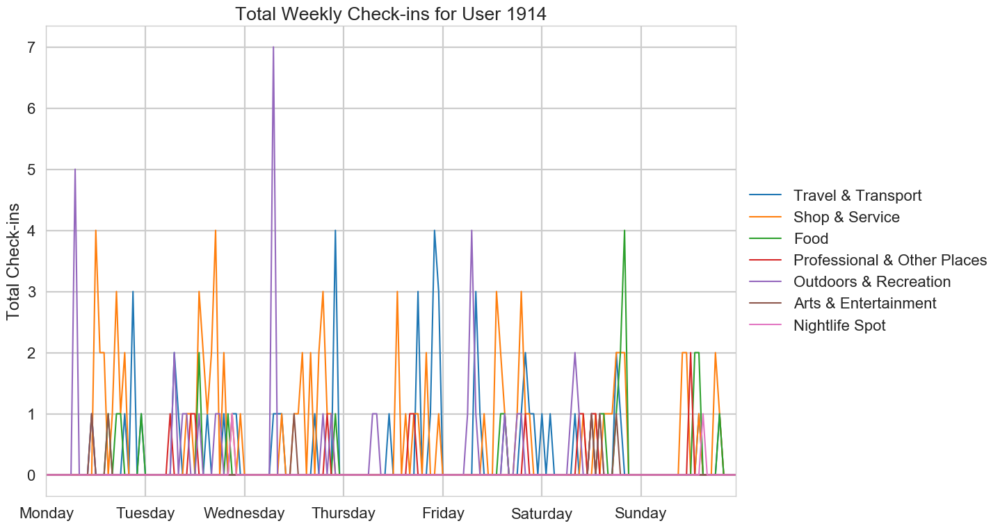

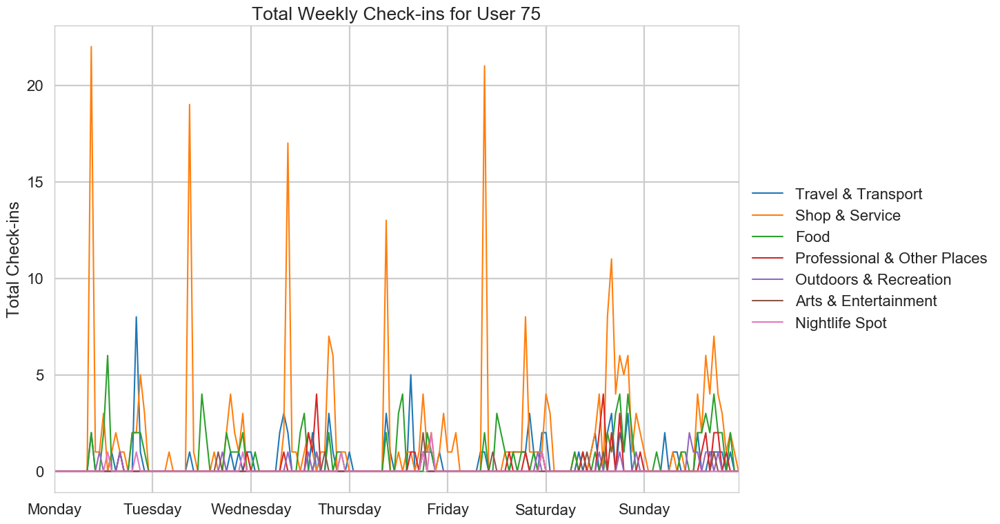

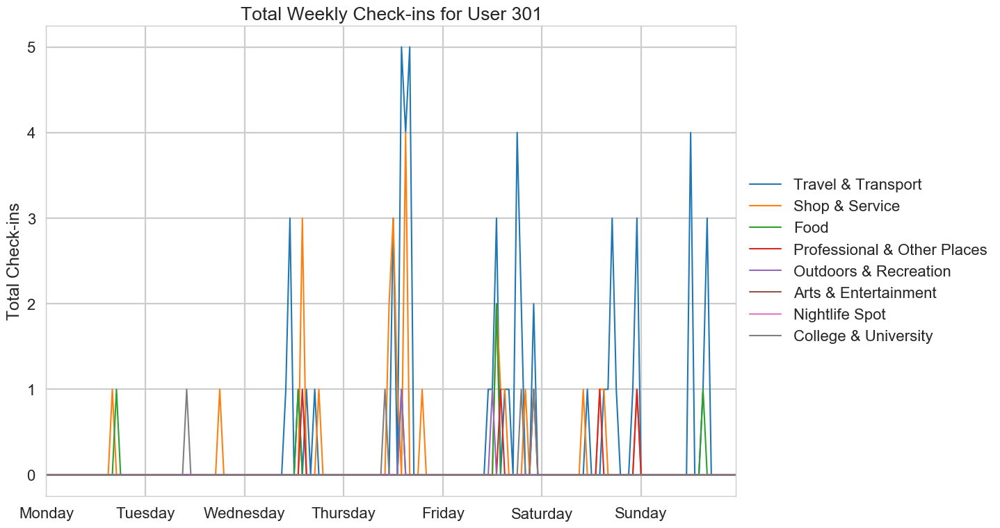

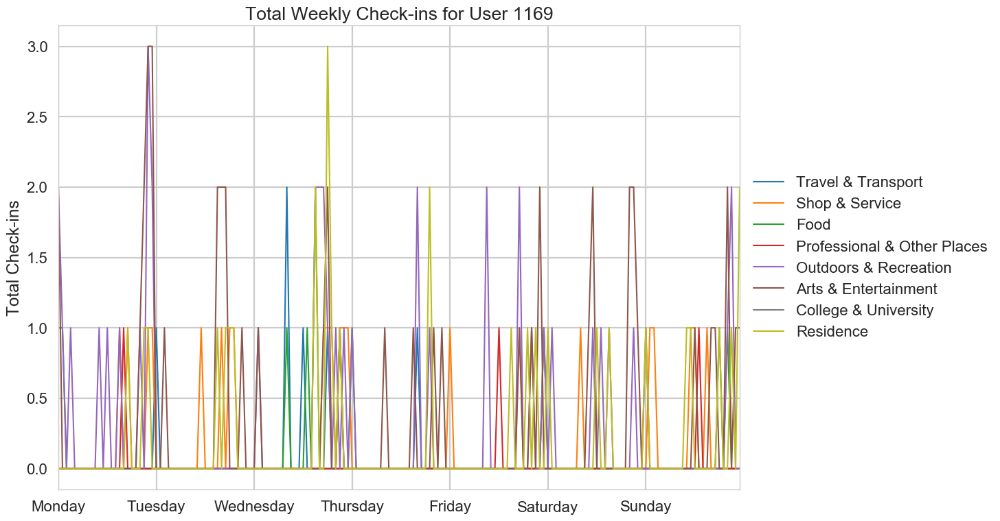

[None, None, None, None, None]

In [20]:
sample_userids = np.random.randint(df.userid.max(), size=5)

[plot_checkins_byweek(df.loc[df.userid == id], col_indices='maincat_encoded', col_names='maincat',
                      title='Total Weekly Check-ins for User {}'.format(id)) for id in sample_userids]

### User-specific weekly check-ins for Train Station, Subway, and all others

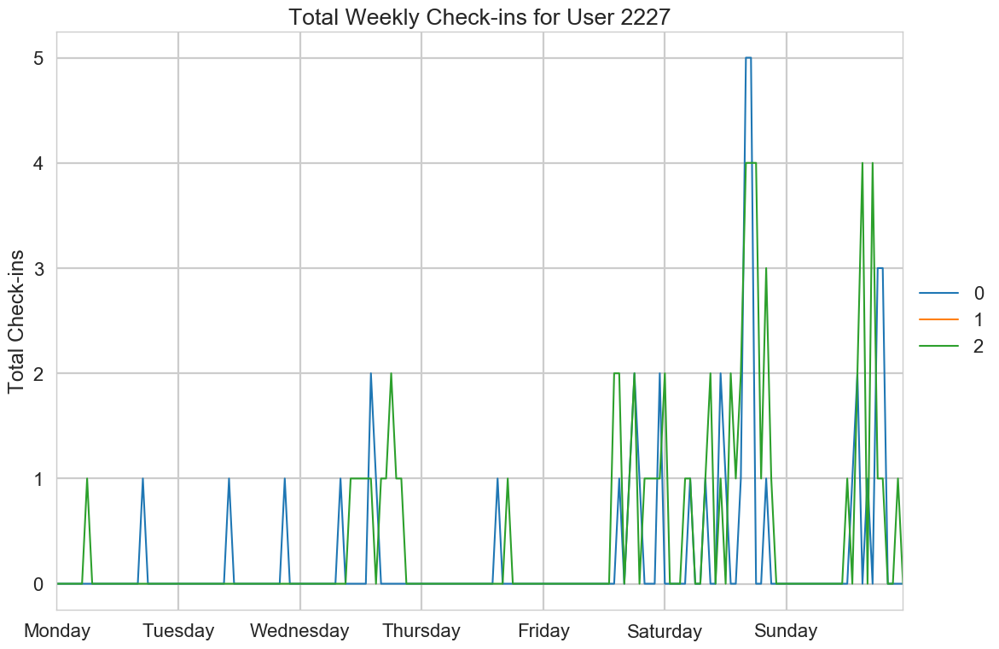

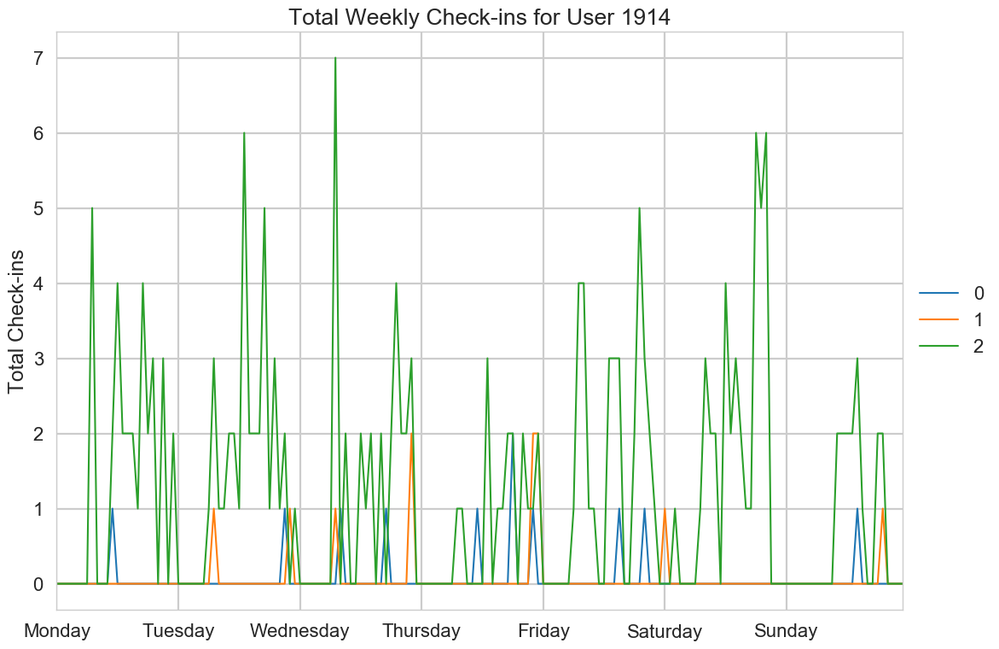

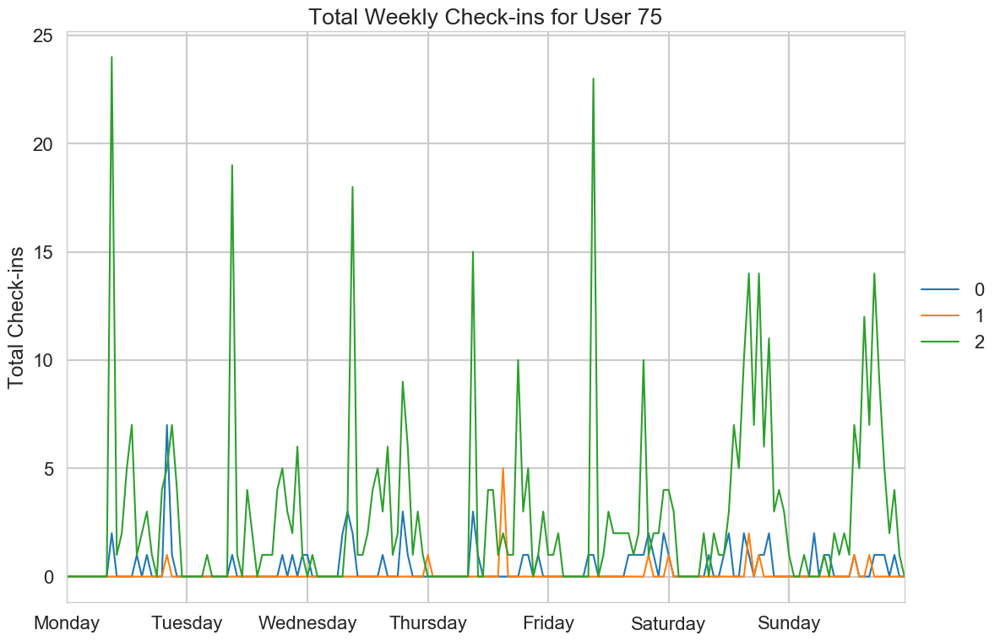

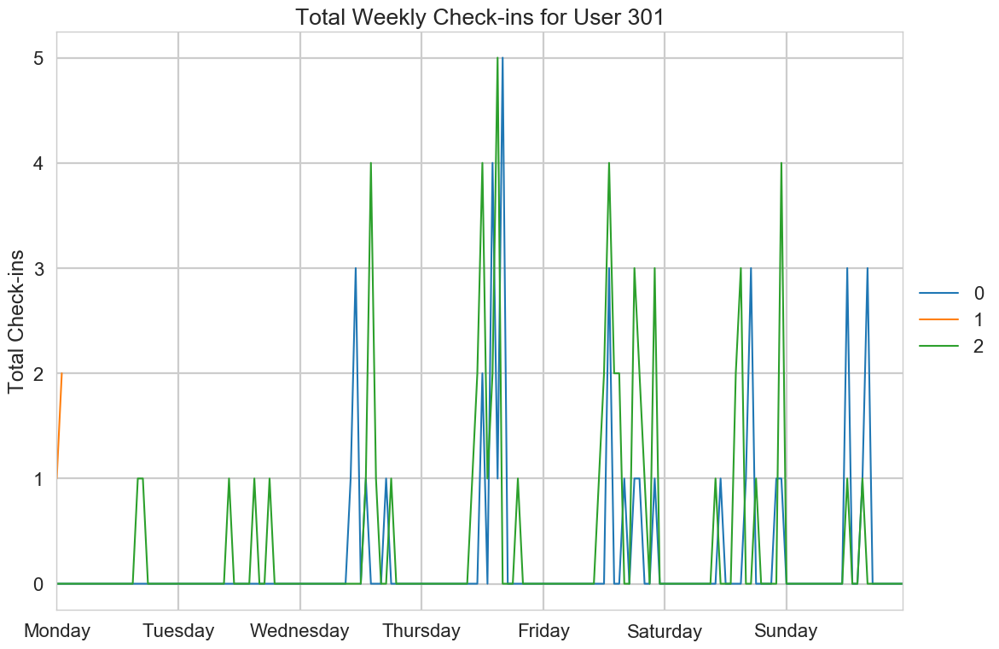

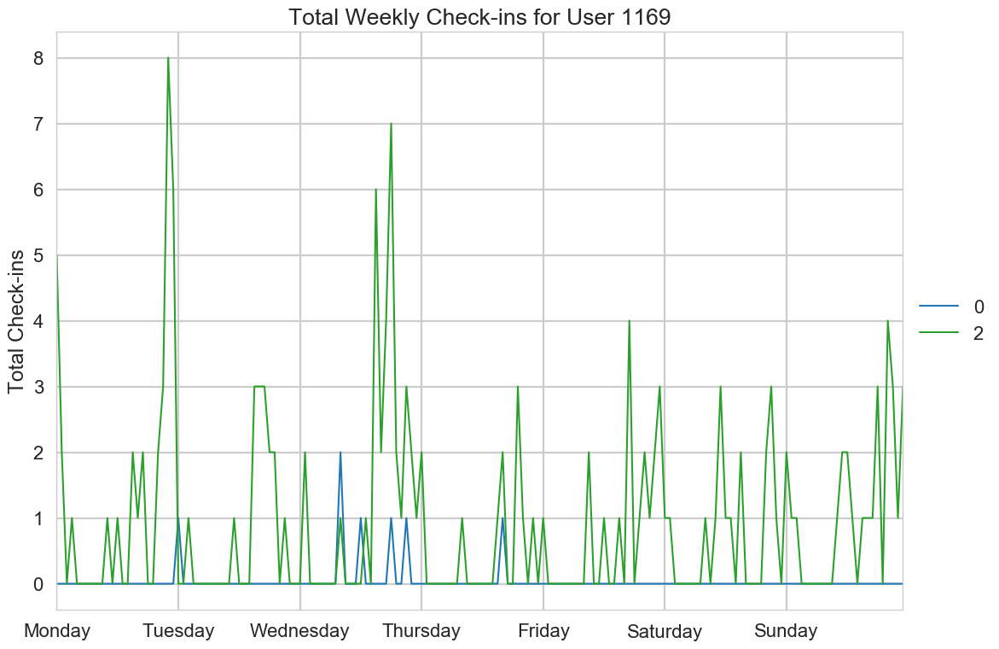

[None, None, None, None, None]

In [21]:
[plot_checkins_byweek(df.loc[df.userid == id], col_indices='y0', col_names='y0',
                      title='Total Weekly Check-ins for User {}'.format(id)) for id in sample_userids]

### Check-ins according to GPS coordinates for main venue categories

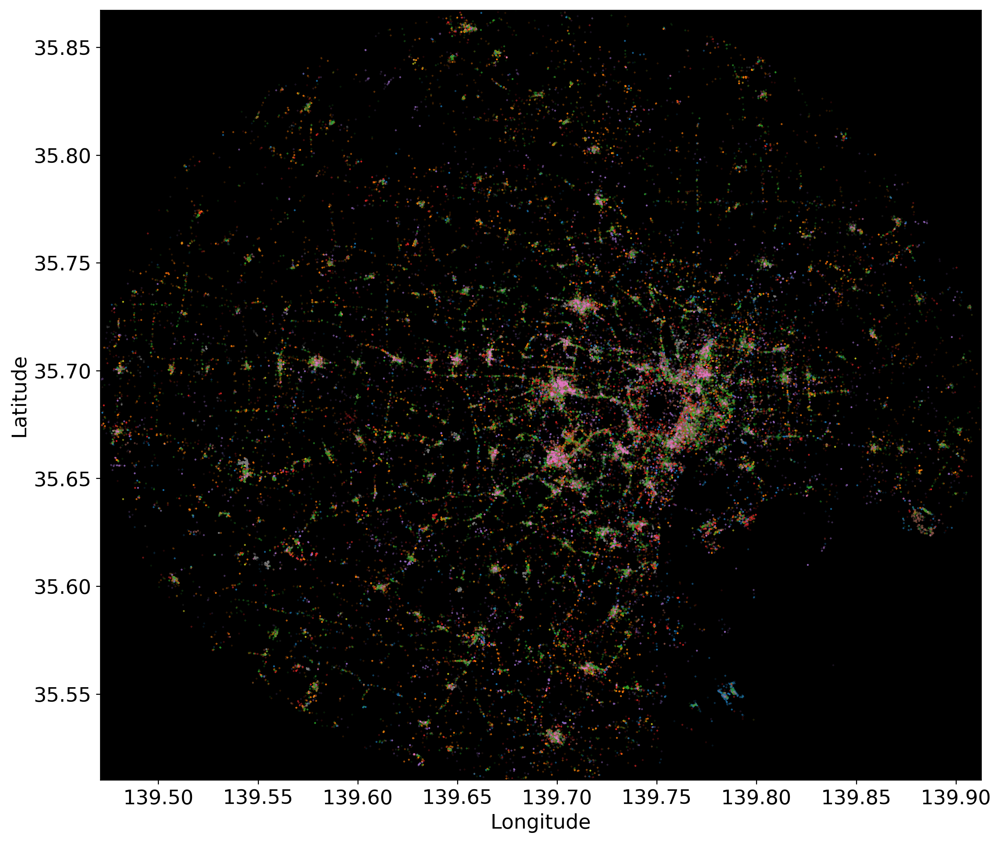

In [22]:
plot_checkins_bygps(df, col_indices="maincat_encoded", composite=True)

### Check-ins according to GPS coordinates for main venue categories, plotted separately

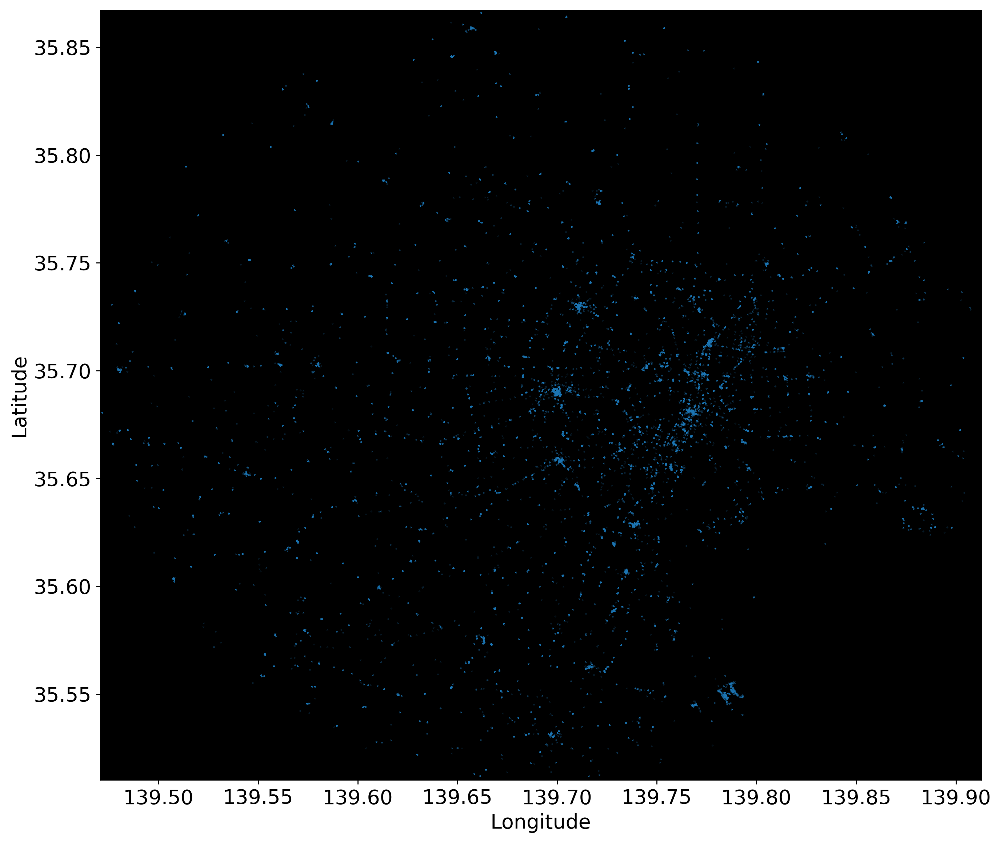

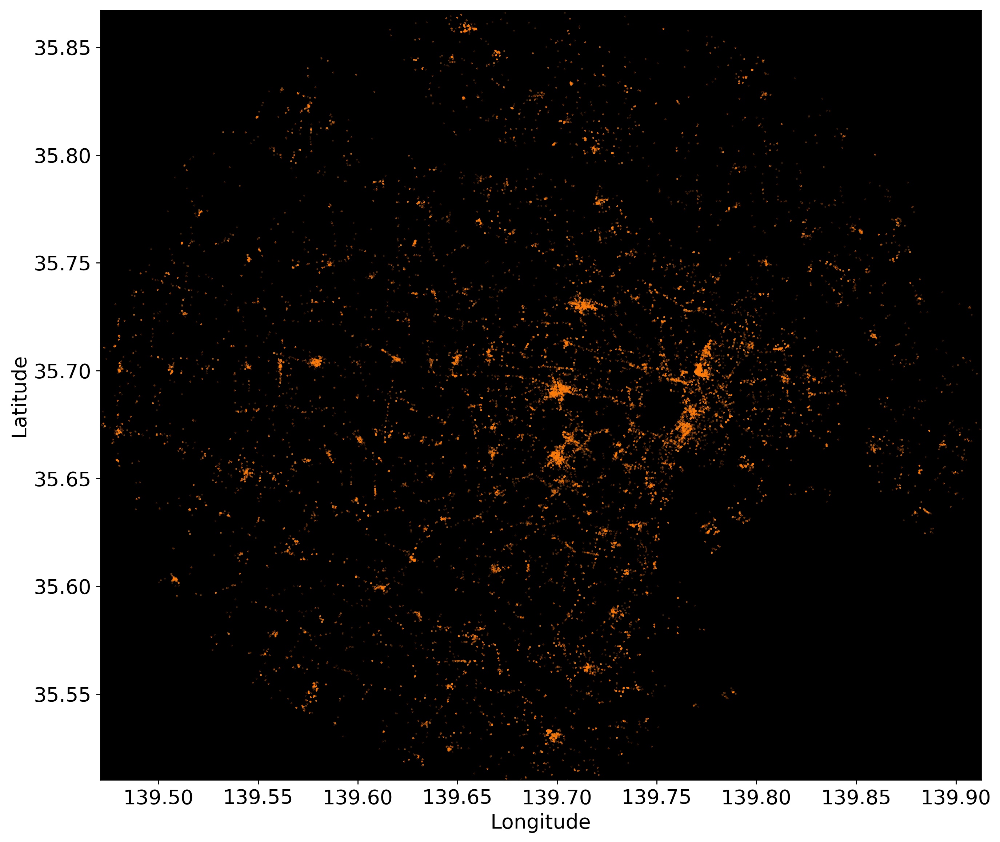

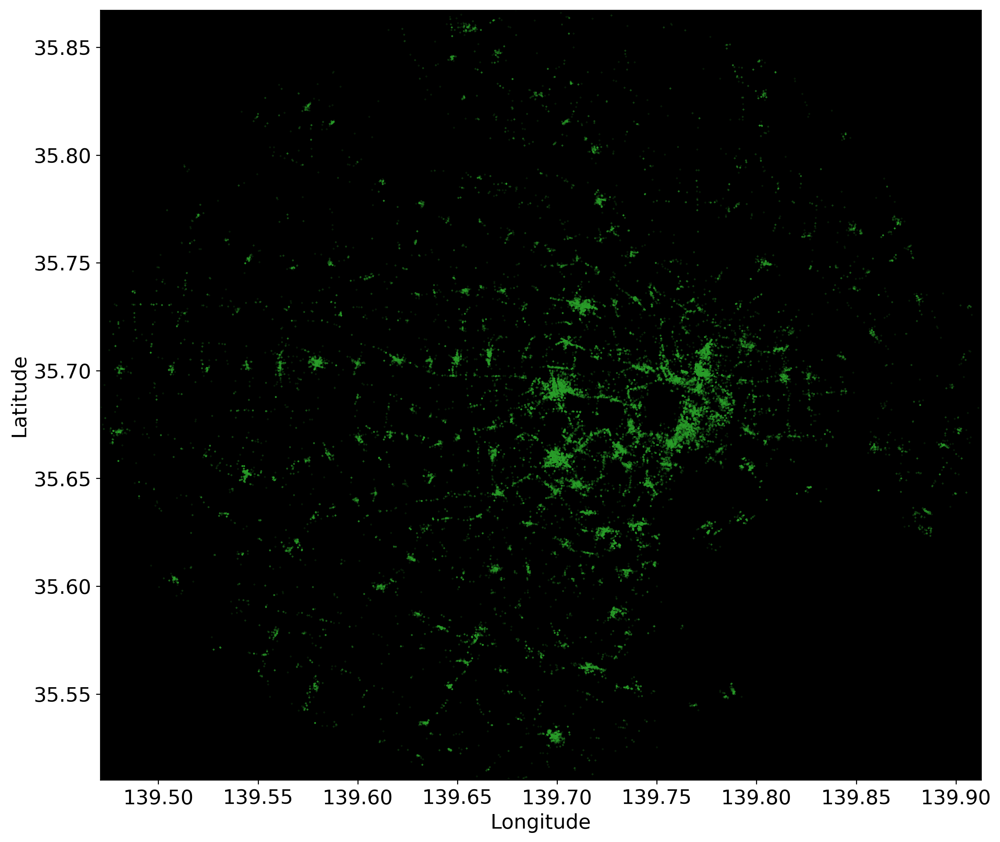

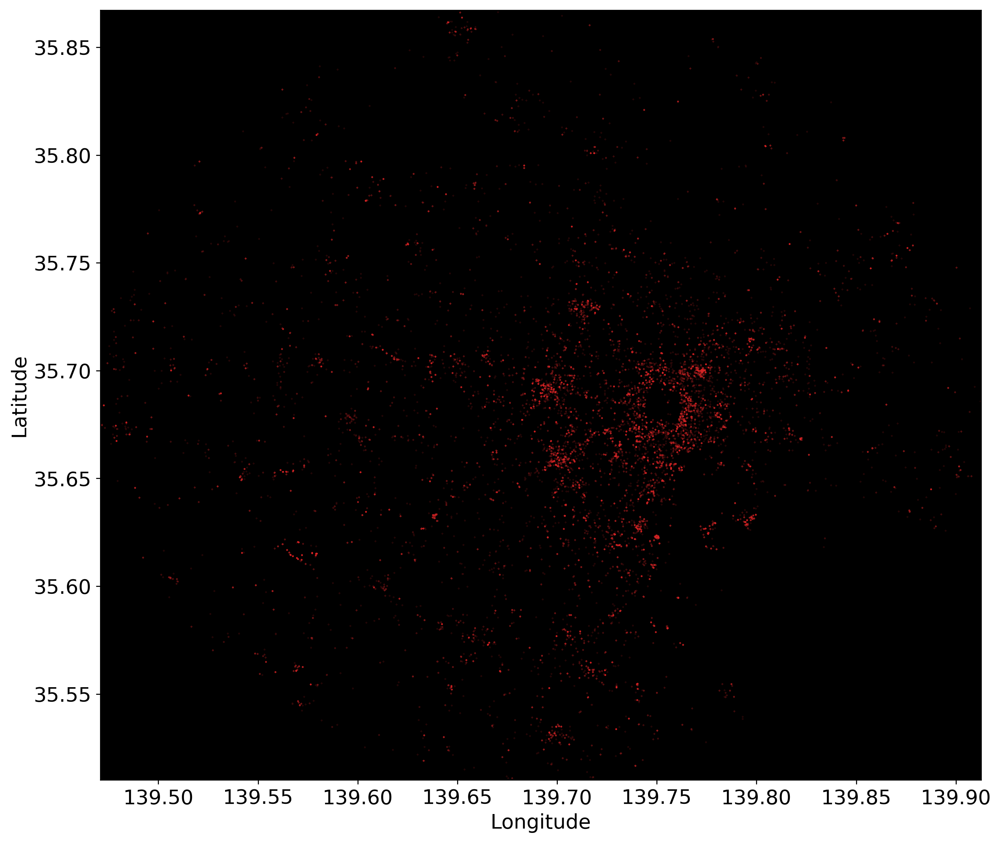

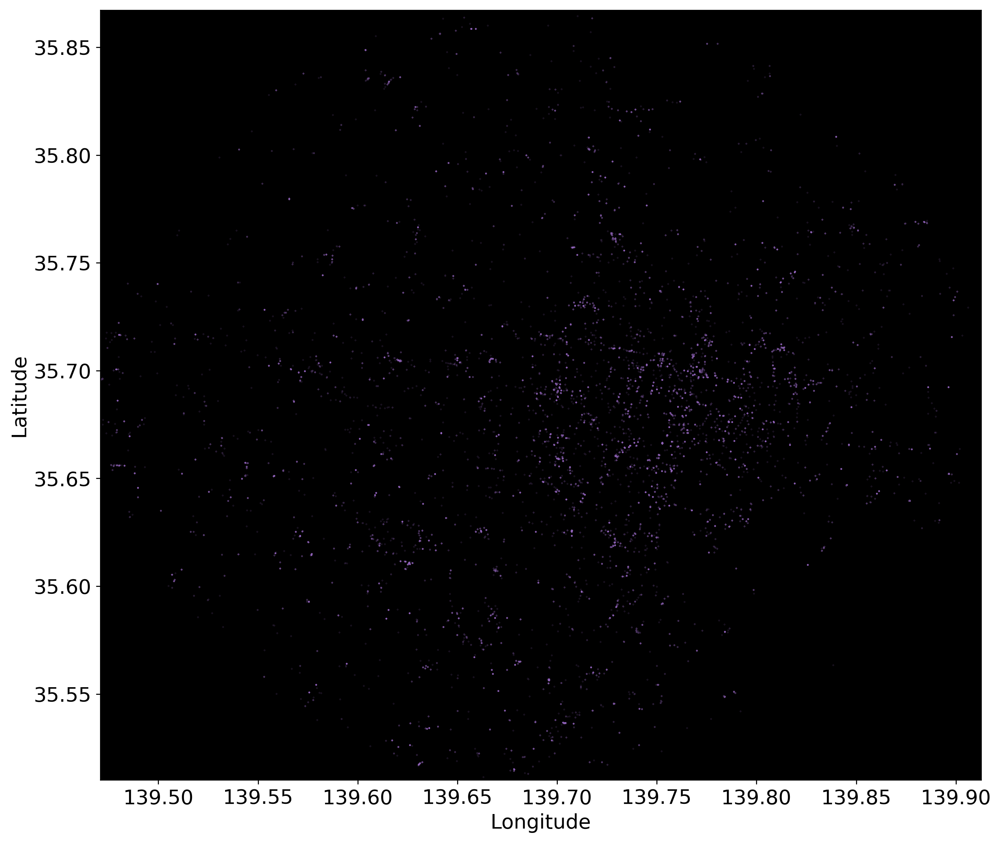

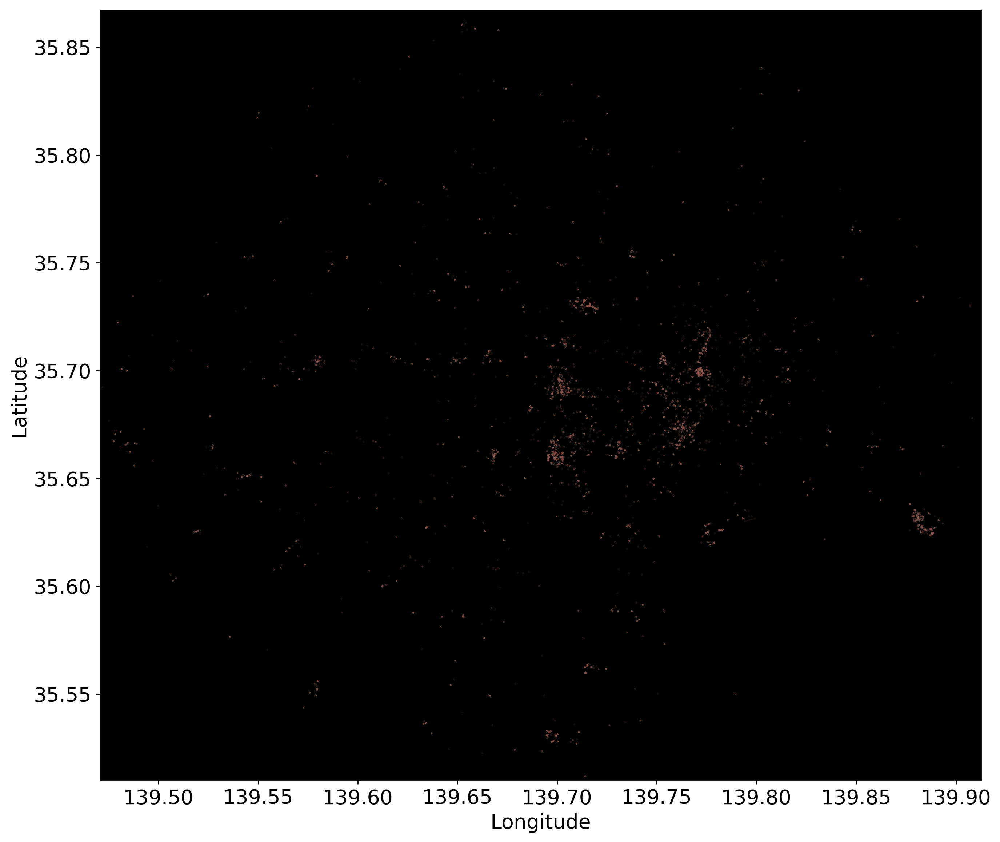

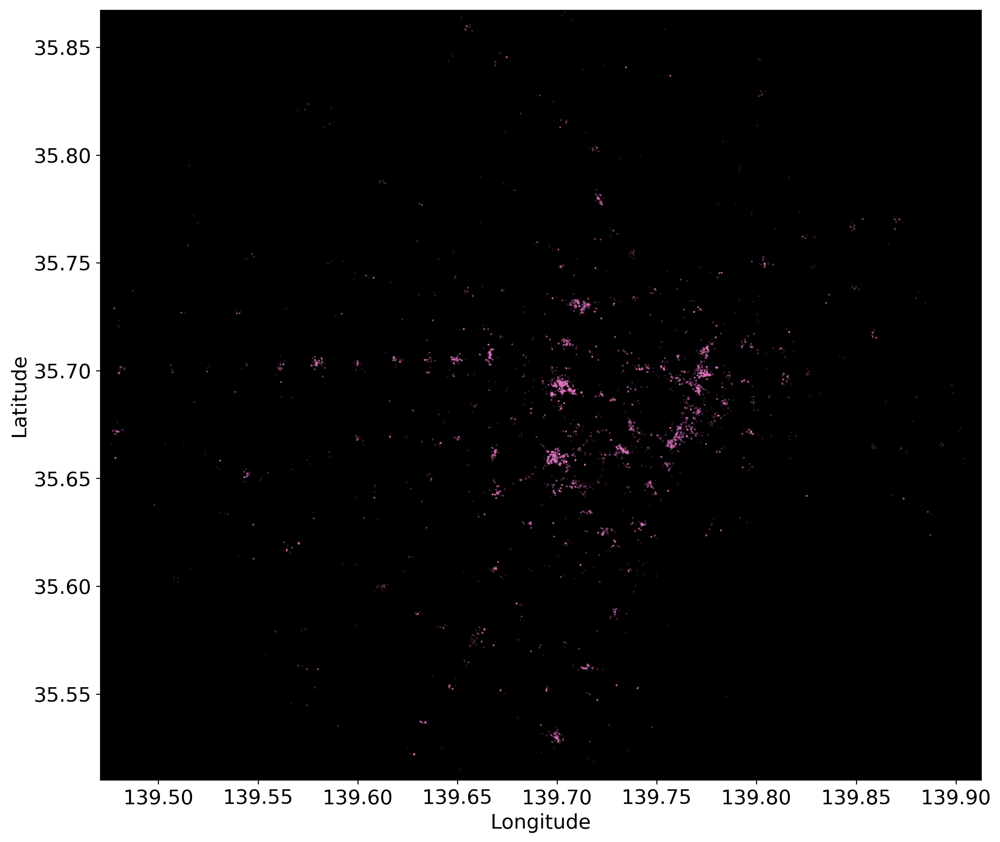

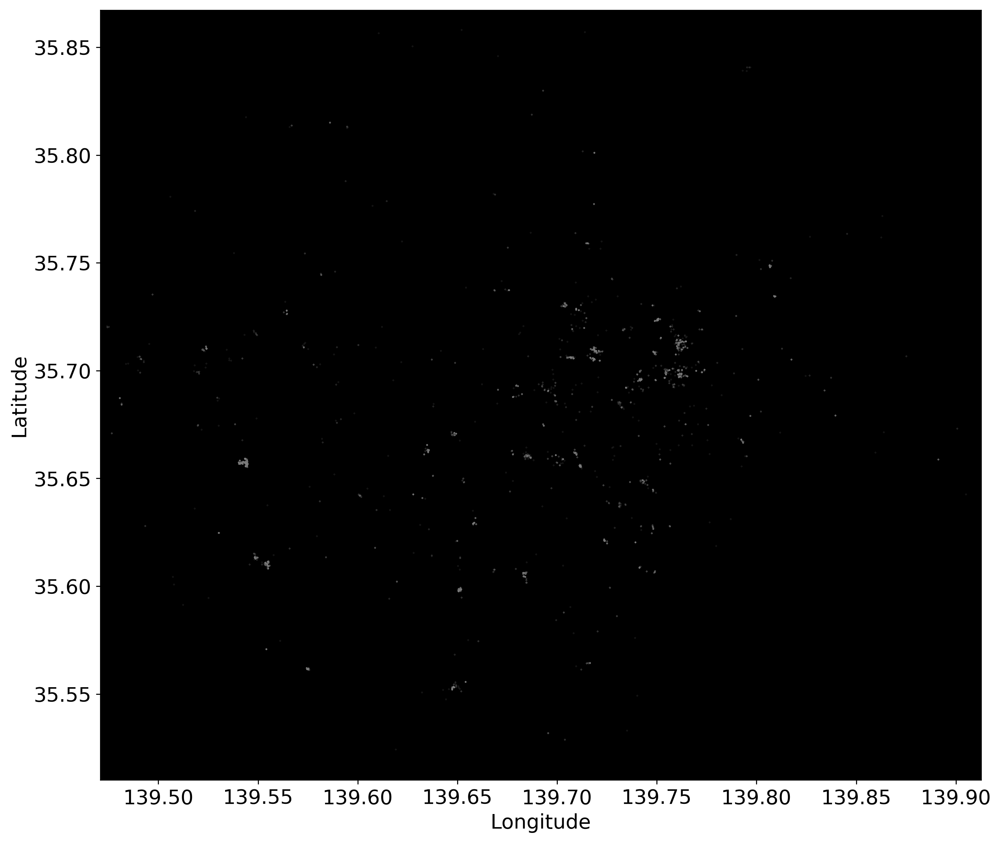

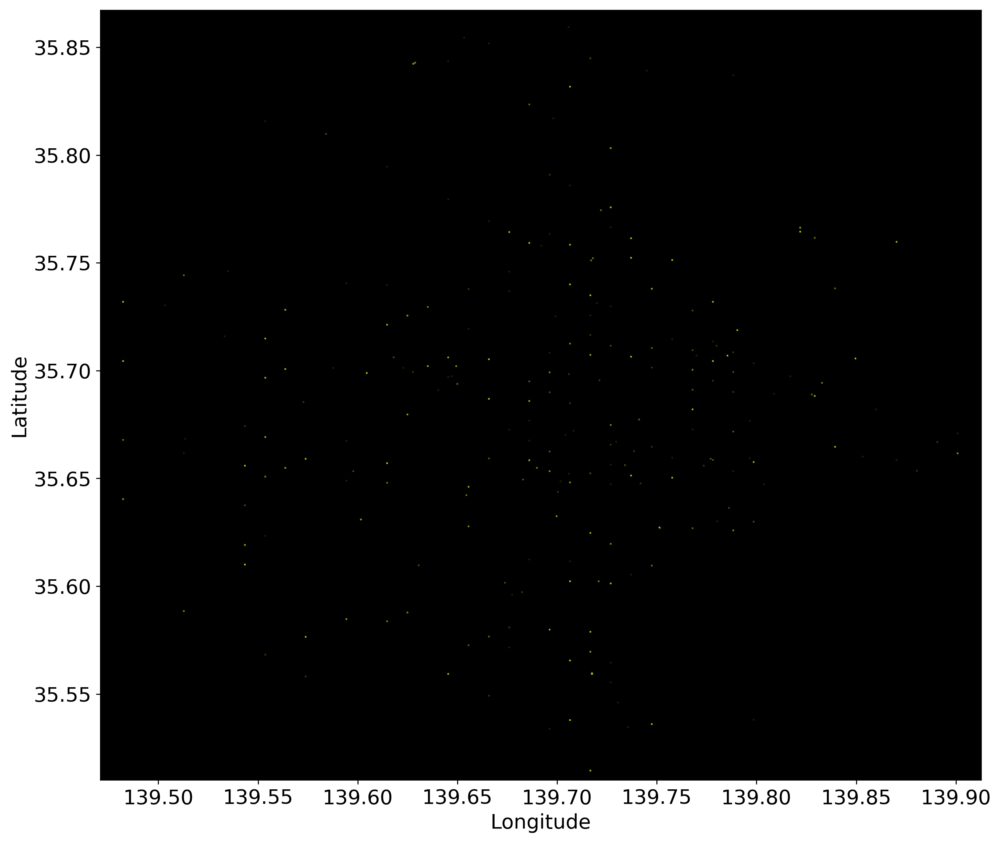

In [23]:
plot_checkins_bygps(df, col_indices="maincat_encoded", composite=False)

### Check-ins according to GPS coordinates for Train Station, Subway, and all others

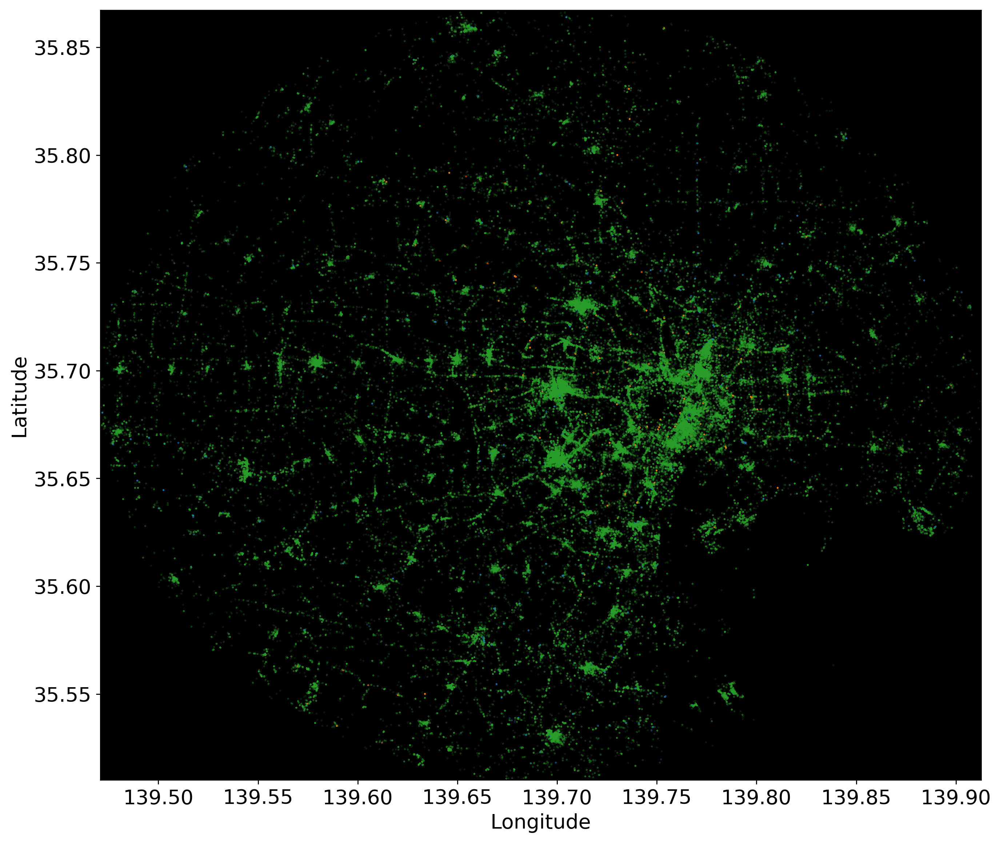

In [24]:
plot_checkins_bygps(df, col_indices="y0", composite=True)

### Check-ins according to GPS coordinates for Train Station, Subway, and all others, plotted separately 

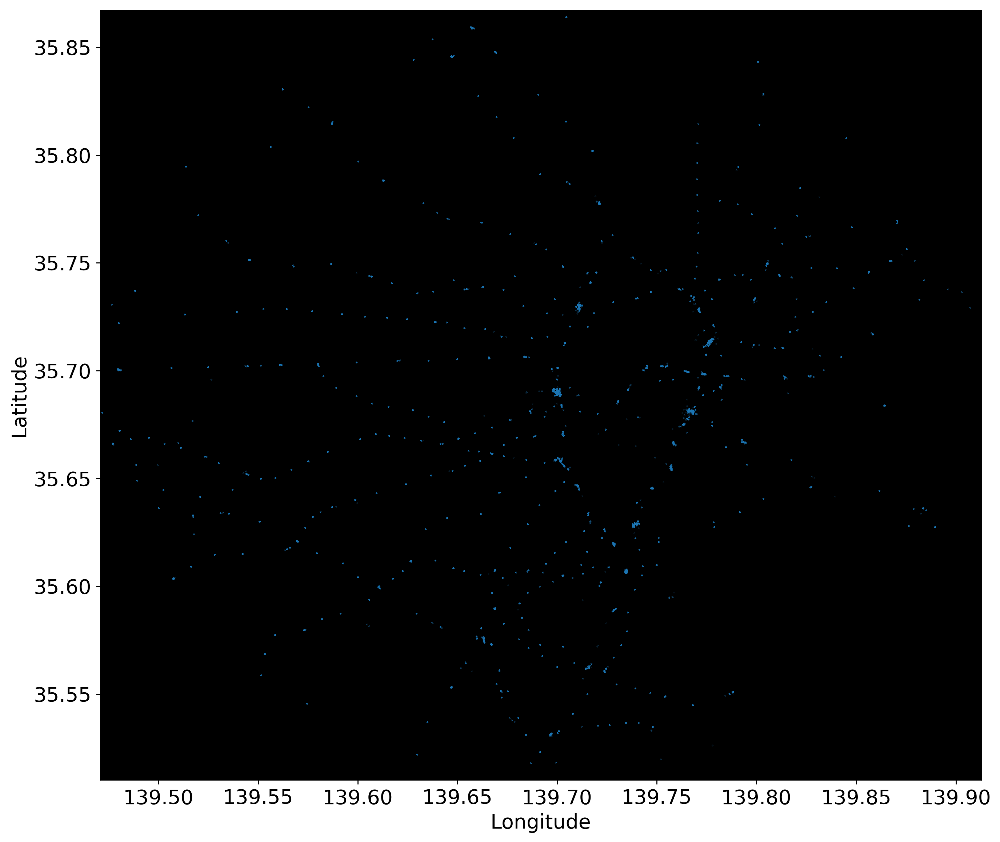

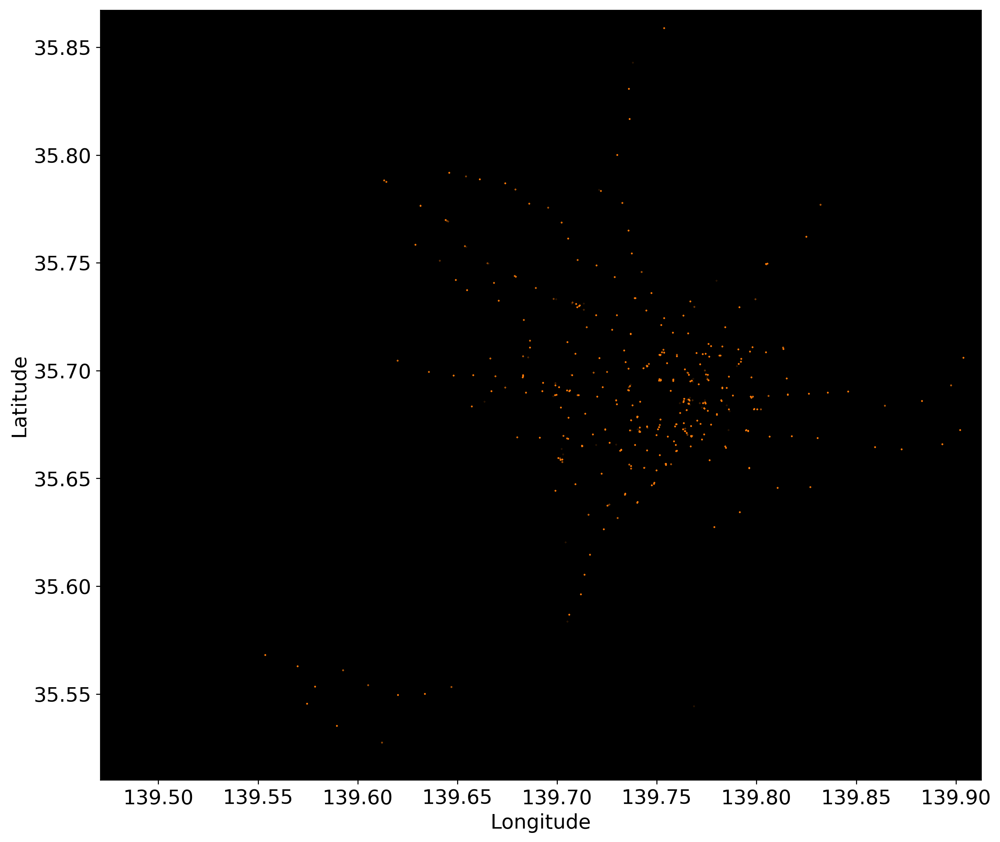

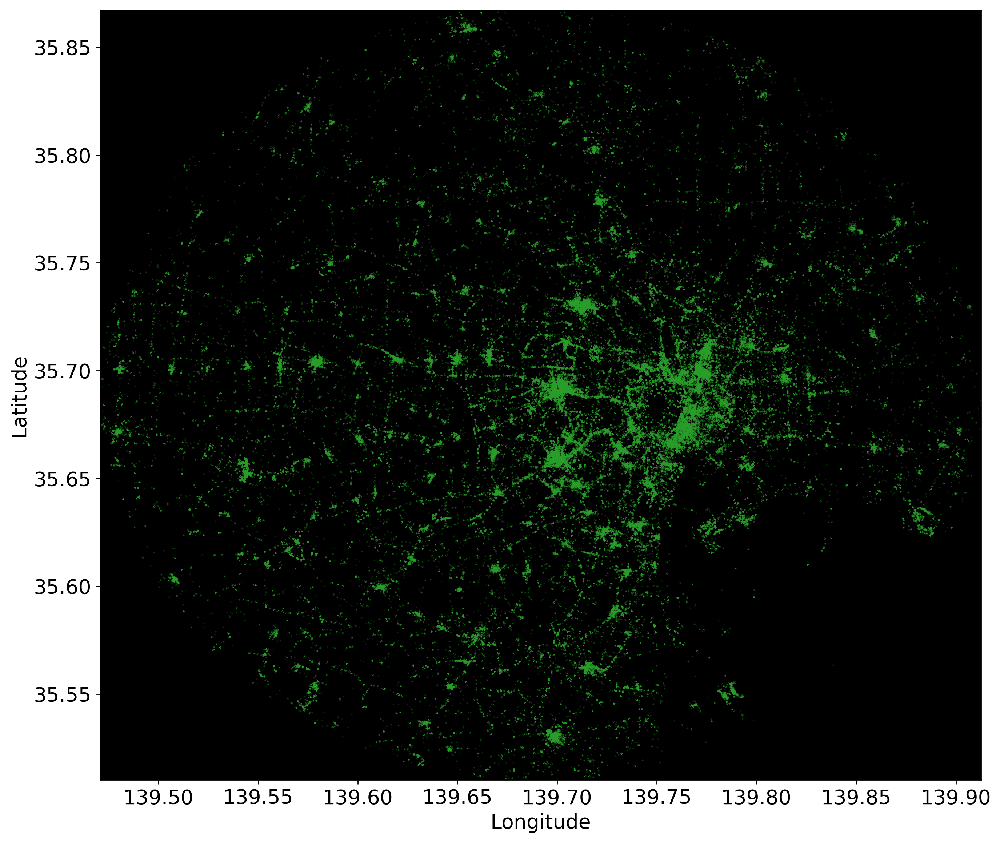

In [25]:
plot_checkins_bygps(df, col_indices="y0", composite=False)

### User-specific check-ins according to GPS coordinates, for Train Station, Subway, and all others

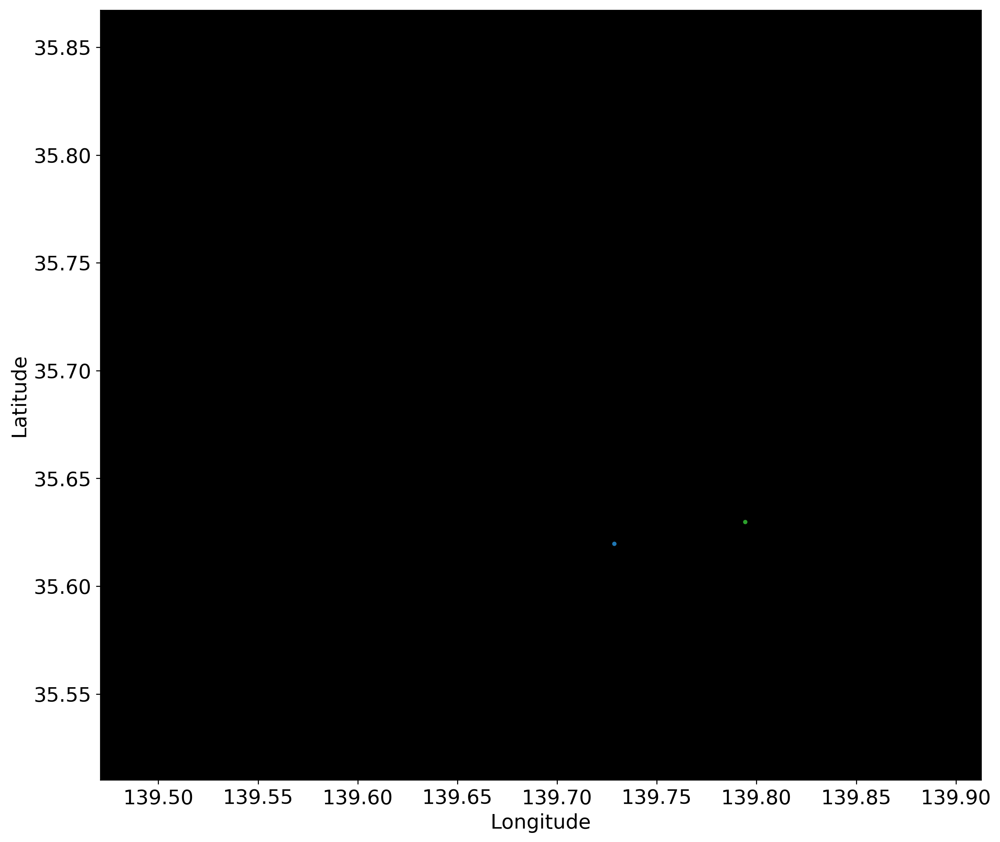

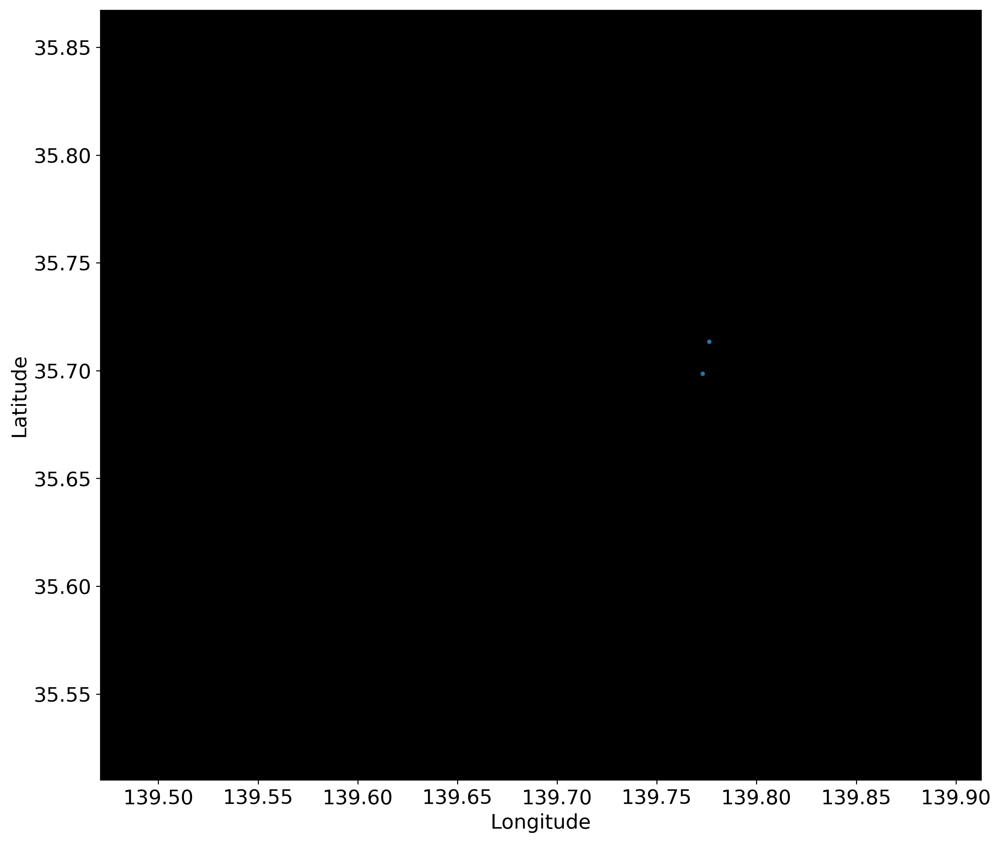

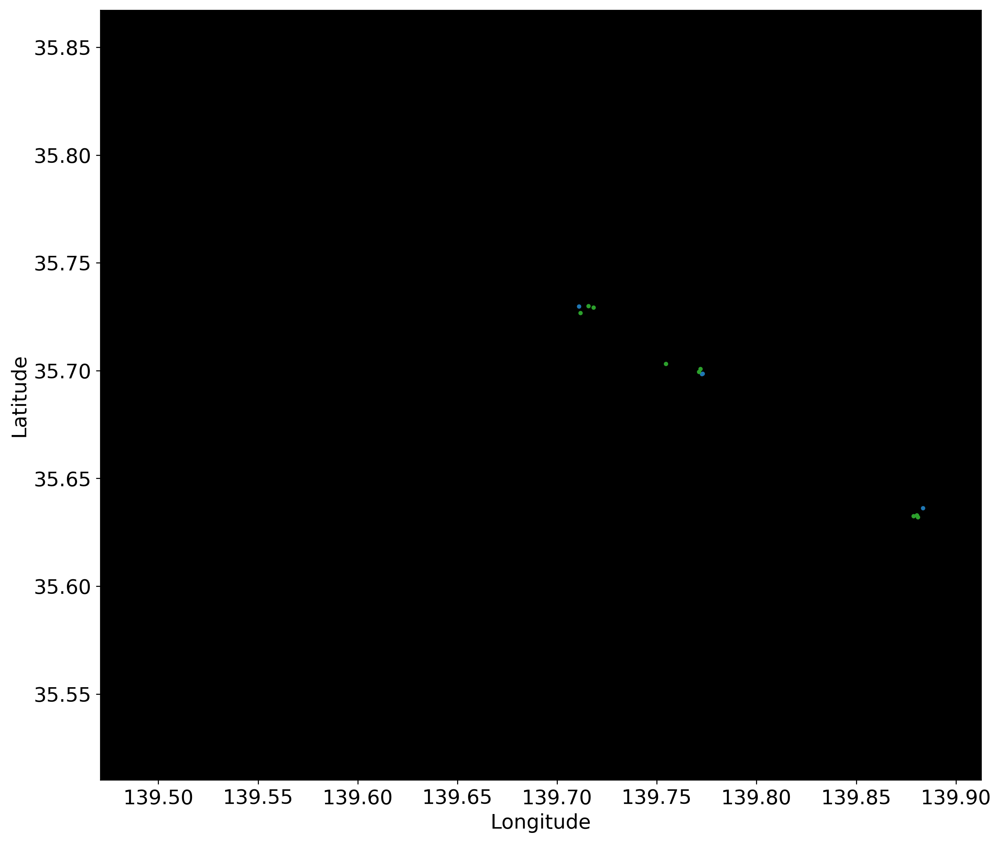

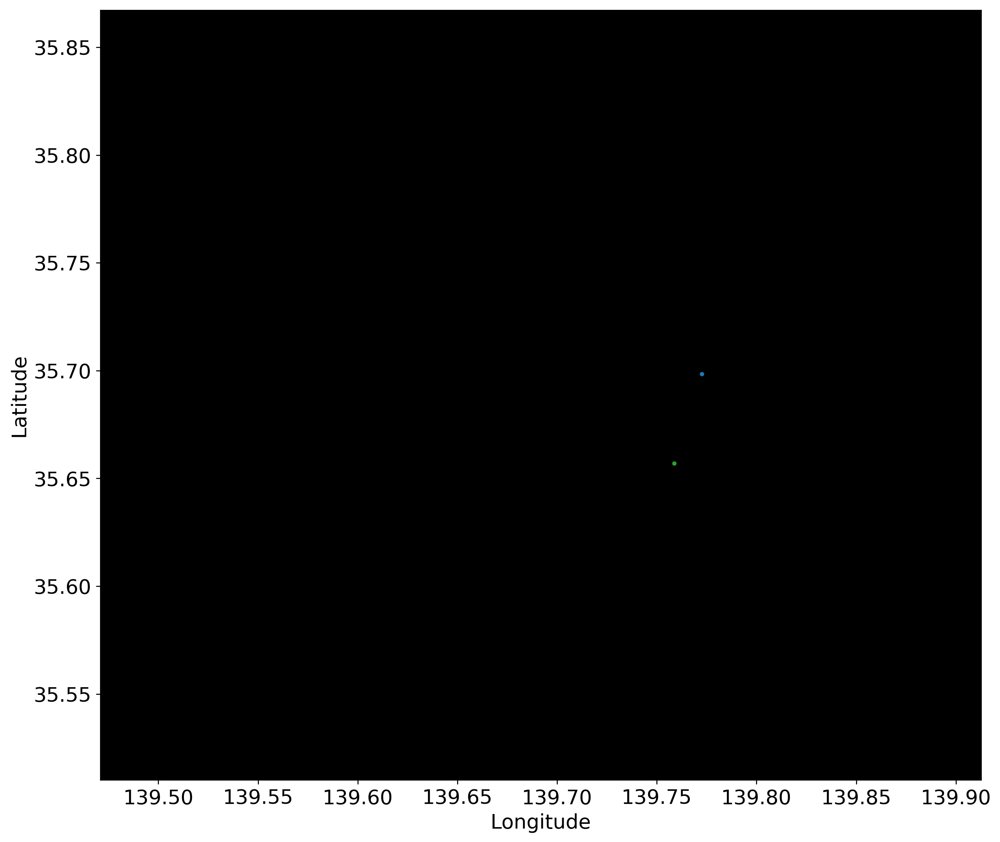

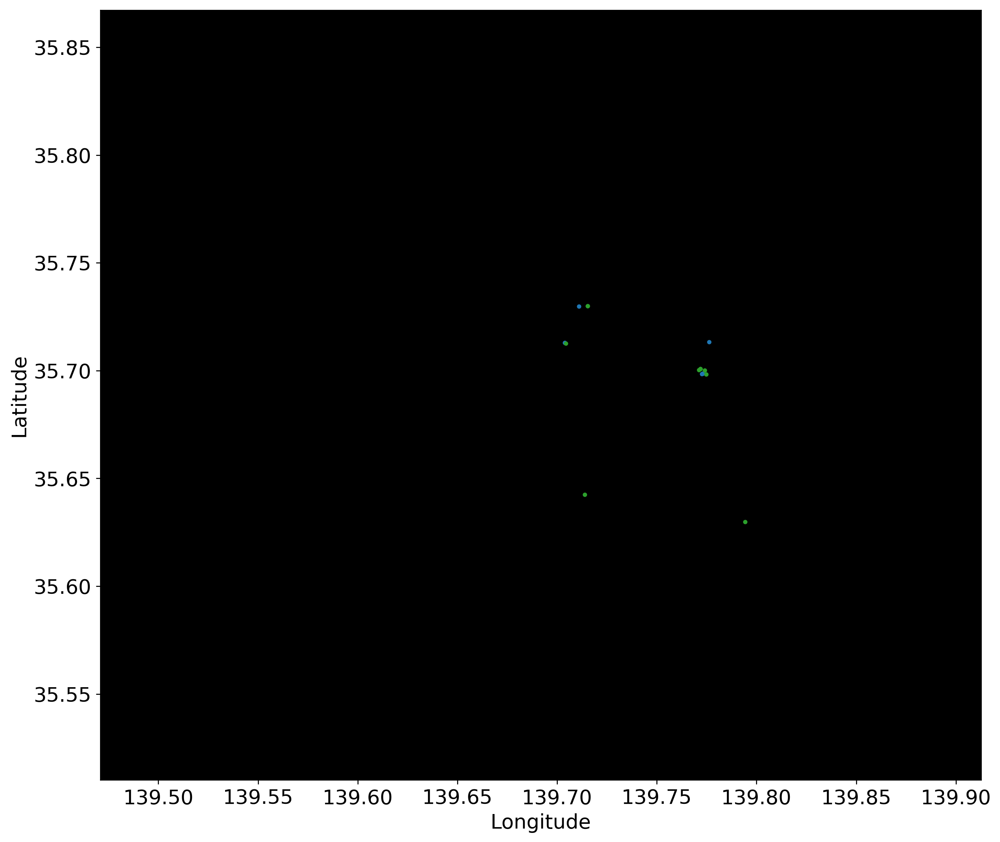

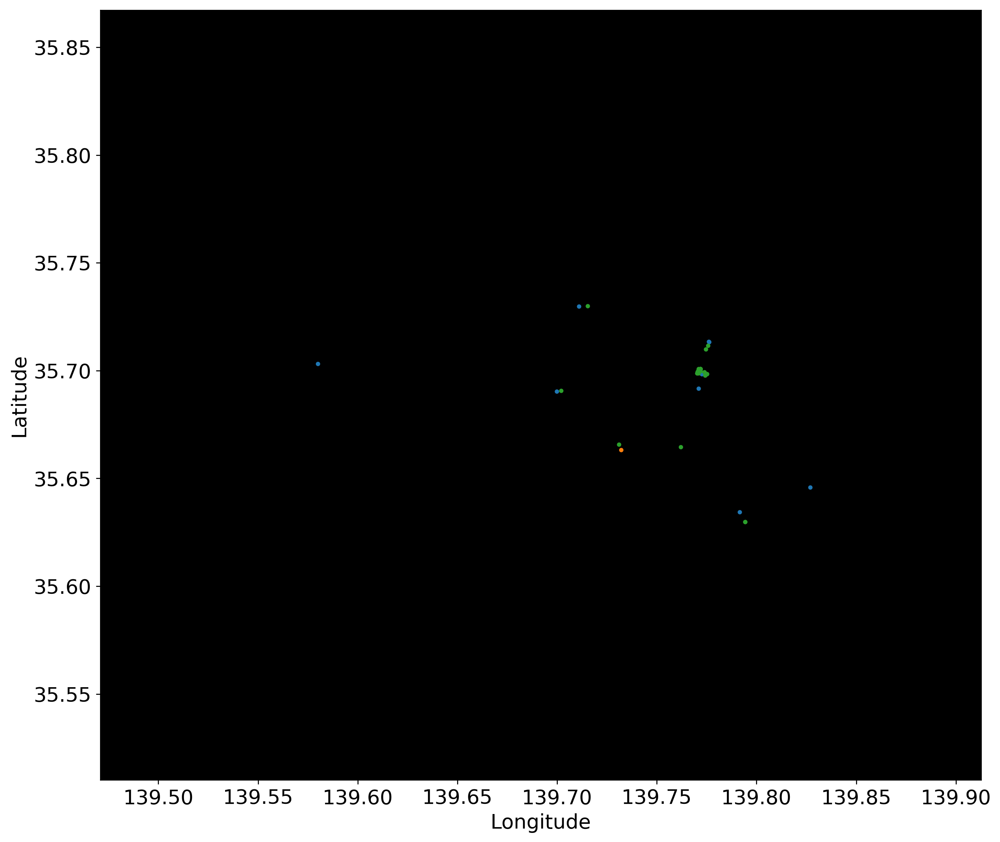

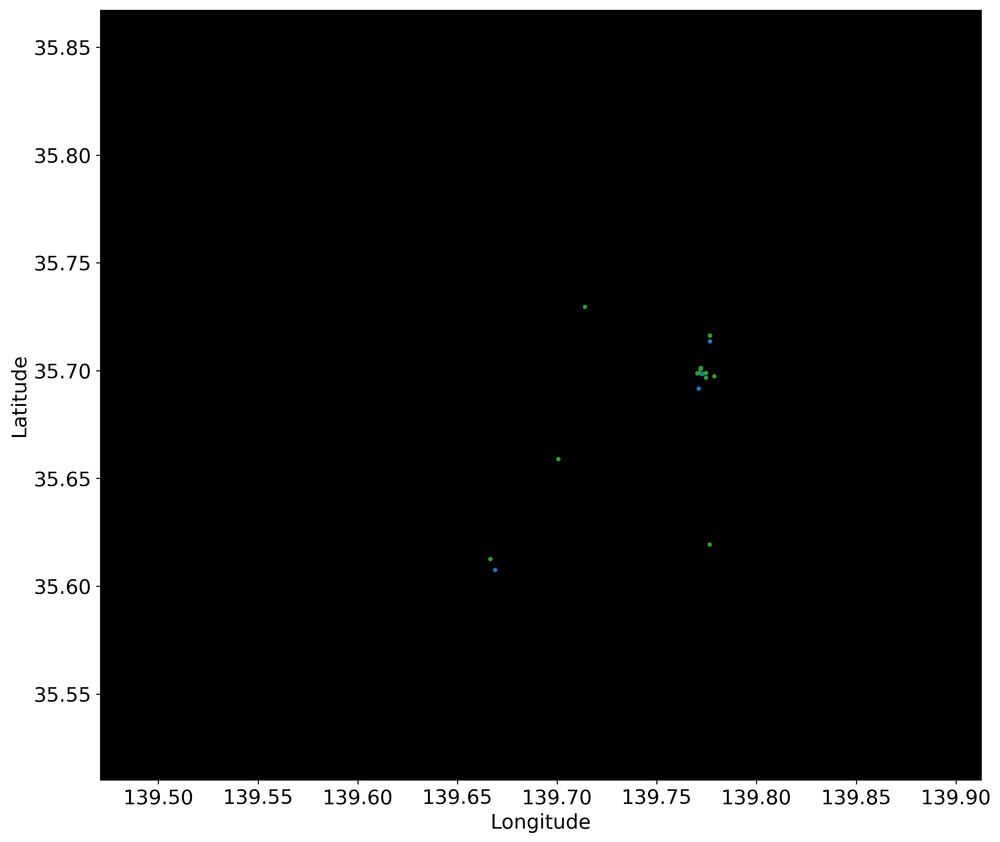

In [26]:
[plot_checkins_bygps(df[(df.userid == sample_userids[0]) & (
    df.day == day)], col_indices="y0", s=6, alpha=1, composite=True) for day in range(7)];